# 🏜️ Desert Semantic Segmentation — Duality AI Hackathon
### DeepLabV3+ with ResNet101 | Maximized IoU Pipeline

**Classes:** Trees, Lush Bushes, Dry Grass, Dry Bushes, Ground Clutter, Flowers, Logs, Rocks, Landscape, Sky  
**Strategy:** Multi-scale augmentation + Mixed Loss (Dice + Focal) + CosineAnnealing LR + Test-Time Augmentation

## 1. Setup & Install Dependencies

In [3]:
# Install required packages
!pip install -q segmentation-models-pytorch albumentations timm torchmetrics
!pip install -q wandb  # optional: for experiment tracking

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 41.4 MB/s eta 0:00:00


In [4]:
import os
import cv2
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from torchmetrics import JaccardIndex, Accuracy

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

Using device: cpu


## 2. Configuration — Edit These Paths & Hyperparameters

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import shutil
import os

# --- Configuration (EDIT THESE) ---
zipped_file_path = '/content/drive/MyDrive/Offroad_Segmentation_Training_Dataset.zip'  # <--- REPLACE WITH YOUR ZIPPED FILE PATH
extraction_dir   = '/content/dataset'                                    # <--- REPLACE WITH YOUR DESIRED EXTRACTION DIRECTORY

# Create the extraction directory if it doesn't exist
os.makedirs(extraction_dir, exist_ok=True)

# Unzip the file
try:
    shutil.unpack_archive(zipped_file_path, extraction_dir)
    print(f'Successfully unzipped "{zipped_file_path}" to "{extraction_dir}"')
except Exception as e:
    print(f'Error unzipping file: {e}')
    print('Please check the file path and ensure the file is a valid archive (zip, tar, etc.).')

# List contents of the extraction directory to verify
print(f'\nContents of {extraction_dir}:')
print(os.listdir(extraction_dir))

Successfully unzipped "/content/drive/MyDrive/Offroad_Segmentation_Training_Dataset.zip" to "/content/dataset"

Contents of /content/dataset:
['Offroad_Segmentation_Training_Dataset']


In [7]:
# --- Configuration (EDIT THESE) ---
zipped_file_path = '/content/drive/MyDrive/Offroad_Segmentation_testImages.zip'  # <--- REPLACE WITH YOUR ZIPPED FILE PATH
extraction_dir   = '/content/dataset/Offroad_Segmentation_Training_Dataset'                                    # <--- REPLACE WITH YOUR DESIRED EXTRACTION DIRECTORY

# Create the extraction directory if it doesn't exist
os.makedirs(extraction_dir, exist_ok=True)

# Unzip the file
try:
    shutil.unpack_archive(zipped_file_path, extraction_dir)
    print(f'Successfully unzipped "{zipped_file_path}" to "{extraction_dir}"')
except Exception as e:
    print(f'Error unzipping file: {e}')
    print('Please check the file path and ensure the file is a valid archive (zip, tar, etc.).')

# List contents of the extraction directory to verify
print(f'\nContents of {extraction_dir}:')
print(os.listdir(extraction_dir))

Successfully unzipped "/content/drive/MyDrive/Offroad_Segmentation_testImages.zip" to "/content/dataset/Offroad_Segmentation_Training_Dataset"

Contents of /content/dataset/Offroad_Segmentation_Training_Dataset:
['val', 'Offroad_Segmentation_testImages', 'train']


In [42]:
# ============================================================
#  CONFIG — adjust paths to your dataset structure
# ============================================================
CFG = {
    # --- Paths ---
    # Mount your Google Drive first if needed:
    # from google.colab import drive; drive.mount('/content/drive')
    'data_root': '/content/dataset',          # root folder
    'train_images': '/content/dataset/Offroad_Segmentation_Training_Dataset/train/Color_Images',
    'train_masks':  '/content/dataset/Offroad_Segmentation_Training_Dataset/train/Segmentation',
    'val_images':   '/content/dataset/Offroad_Segmentation_Training_Dataset/val/Color_Images',    # set to None to auto-split
    'val_masks':    '/content/dataset/Offroad_Segmentation_Training_Dataset/val/Segmentation',     # set to None to auto-split
    'test_images':  '/content/dataset/Offroad_Segmentation_Training_Dataset/test/Color_Images',
    'test_masks':   '/content/dataset/Offroad_Segmentation_Training_Dataset/test/Segmentation',
    'output_dir':   '/content/outputs',

    # --- Model ---
    'encoder': 'resnet101',          # backbone
    'encoder_weights': 'imagenet',   # pretrained weights
    'architecture': 'DeepLabV3Plus', # smp architecture

    # --- Training ---
    #'img_size': 512,         # input crop size (use 512 for A100, 384 for T4)

    'img_size': 384,
    'batch_size': 8,          # reduce to 4 if OOM
    'num_workers': 0,         # Set to 0 to avoid multiprocessing issues in Colab
    'epochs': 60,
    'val_split': 0.15,        # used only if val_images=None

    # --- Optimizer ---
    'lr': 3e-4,
    'weight_decay': 1e-4,
    'lr_min': 1e-6,

    # --- Loss ---
    # Combined Dice + Focal works very well for imbalanced multi-class seg
    'dice_weight': 0.6,
    'focal_weight': 0.4,

    # --- Classes (must match your mask encoding) ---
    # IMPORTANT: Update mask_type and class definitions below
    # Options: 'index' (mask pixel = class index 0..N-1)
    #          'rgb'   (mask is color-coded RGB)
    'mask_type': 'index',

    # Used only when mask_type='rgb'
    # Format: {class_name: [R, G, B]}
    'class_rgb_map': {
        'background':    [0,   0,   0],
        'trees':         [0,   128, 0],
        'lush_bushes':   [0,   255, 0],
        'dry_grass':     [255, 255, 0],
        'dry_bushes':    [128, 128, 0],
        'ground_clutter':[128, 0,   0],
        'flowers':       [255, 0,   255],
        'logs':          [128, 64,  0],
        'rocks':         [128, 128, 128],
        'landscape':     [64,  32,  0],
        'sky':           [135, 206, 235],
    },

    # Used when mask_type='index' — just the class names in order
    'class_names': [
        'background', 'trees', 'lush_bushes', 'dry_grass',
        'dry_bushes', 'ground_clutter', 'flowers', 'logs',
        'rocks', 'landscape', 'sky'
    ],

    # NEW: Mapping from raw pixel values in mask files to 0-indexed class IDs.
    # This is based on the observed unique values and the defined class_names.
    # Verify these mappings against your dataset's actual label definitions.
    'raw_label_id_to_class_idx': {
        0: 0,     # background
        100: 1,   # trees
        200: 2,   # lush_bushes
        300: 3,   # dry_grass
        550: 4,   # dry_bushes
        800: 5,   # ground_clutter
        7100: 6,  # flowers
        10000: 7, # logs
        400: 8,   # rocks (Assumed raw ID, needs verification)
        600: 9,   # landscape (Assumed raw ID, needs verification)
        900: 10   # sky (Assumed raw ID, needs verification)
    },

    # --- Misc ---
    'use_amp': True,          # automatic mixed precision (faster on modern GPUs)
    'tta': True,              # test-time augmentation at inference
    'save_preds': True,       # save prediction masks to disk
}

NUM_CLASSES = len(CFG['class_names'])
os.makedirs(CFG['output_dir'], exist_ok=True)
print(f'Number of classes: {NUM_CLASSES}')
print(f'Classes: {CFG["class_names"]}')

Number of classes: 11
Classes: ['background', 'trees', 'lush_bushes', 'dry_grass', 'dry_bushes', 'ground_clutter', 'flowers', 'logs', 'rocks', 'landscape', 'sky']


## 3. Dataset & Augmentations

In [15]:
# ============================================================
# Mask Decoder — handles both index masks & RGB color masks
# ============================================================
def decode_mask_rgb(mask_rgb, class_rgb_map):
    """Convert an RGB color mask to a class-index mask."""
    h, w = mask_rgb.shape[:2]
    label = np.zeros((h, w), dtype=np.int64)
    for idx, (cls_name, rgb) in enumerate(class_rgb_map.items()):
        match = np.all(mask_rgb == rgb, axis=-1)
        label[match] = idx
    return label


class DesertDataset(Dataset):
    """
    Desert semantic segmentation dataset.
    Supports both index-encoded and RGB-encoded masks.
    """
    def __init__(self, image_dir, mask_dir, transform=None, cfg=CFG):
        self.image_paths = sorted(Path(image_dir).glob('*'))
        self.mask_paths  = sorted(Path(mask_dir).glob('*'))
        assert len(self.image_paths) == len(self.mask_paths), \
            f'Image/mask count mismatch: {len(self.image_paths)} vs {len(self.mask_paths)}'
        self.transform = transform
        self.cfg = cfg

        # Prepare the raw label ID to class index mapping lookup table if provided
        self.raw_to_idx_map_lookup = None
        if self.cfg['mask_type'] == 'index' and 'raw_label_id_to_class_idx' in self.cfg:
            raw_map = self.cfg['raw_label_id_to_class_idx']
            if raw_map:
                # Find the maximum raw ID to determine array size for the lookup table
                max_raw_id = max(raw_map.keys())
                # Initialize lookup table with a default value (e.g., 0 for background or ignore_index)
                self.raw_to_idx_map_lookup = np.zeros(max_raw_id + 1, dtype=np.int64)
                for raw_id, class_idx in raw_map.items():
                    if raw_id <= max_raw_id: # Ensure we don't go out of bounds
                        self.raw_to_idx_map_lookup[raw_id] = class_idx

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.cvtColor(cv2.imread(str(self.image_paths[idx])), cv2.COLOR_BGR2RGB)
        mask_raw = cv2.imread(str(self.mask_paths[idx]), cv2.IMREAD_UNCHANGED)

        if self.cfg['mask_type'] == 'rgb':
            mask_raw = cv2.cvtColor(mask_raw, cv2.COLOR_BGR2RGB)
            mask = decode_mask_rgb(mask_raw, self.cfg['class_rgb_map'])
        else:
            # index mask — single channel or grayscale
            if mask_raw.ndim == 3:
                mask_raw = mask_raw[:, :, 0]

            # Apply raw label ID mapping if available
            if self.raw_to_idx_map_lookup is not None:
                # Ensure mask_raw values are within the lookup table's bounds
                # Values not in the map will be mapped to 0 (or default value of lookup_table)
                mask = self.raw_to_idx_map_lookup[mask_raw].astype(np.int64)
            else:
                mask = mask_raw.astype(np.int64)

        if self.transform:
            aug = self.transform(image=image, mask=mask)
            image, mask = aug['image'], aug['mask']

        return image, mask.long()


class DesertTestDataset(Dataset):
    """Test dataset (no masks)."""
    def __init__(self, image_dir, transform=None):
        self.image_paths = sorted(Path(image_dir).glob('*'))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.cvtColor(cv2.imread(str(self.image_paths[idx])), cv2.COLOR_BGR2RGB)
        fname = self.image_paths[idx].name
        if self.transform:
            aug = self.transform(image=image)
            image = aug['image']
        return image, fname

In [10]:
# ============================================================
# Augmentation Pipelines
# ============================================================
IMG_MEAN = [0.485, 0.456, 0.406]   # ImageNet stats
IMG_STD  = [0.229, 0.224, 0.225]

def get_train_transform(img_size=512):
    return A.Compose([
        # --- Spatial augmentations ---
        A.RandomResizedCrop(size=(img_size, img_size),
                            scale=(0.5, 1.0), ratio=(0.75, 1.33), p=1.0),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomRotate90(p=0.3),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1,
                           rotate_limit=15, p=0.4),
        A.GridDistortion(num_steps=5, distort_limit=0.1, p=0.2),

        # --- Color / photometric augmentations (desert-specific) ---
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0),
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=30,
                                 val_shift_limit=20, p=1.0),
        ], p=0.6),
        A.RandomShadow(p=0.2),          # simulates terrain shadow variation
        A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.25, p=0.1),  # haze
        A.GaussNoise(var_limit=(10, 50), p=0.2),
        A.GaussianBlur(blur_limit=(3, 5), p=0.1),

        # --- Normalize & tensorize ---
        A.Normalize(mean=IMG_MEAN, std=IMG_STD),
        ToTensorV2(),
    ])


def get_val_transform(img_size=512):
    return A.Compose([
        A.Resize(height=img_size, width=img_size),
        A.Normalize(mean=IMG_MEAN, std=IMG_STD),
        ToTensorV2(),
    ])


def get_tta_transforms(img_size=512):
    """Returns a list of TTA transforms (applied one-at-a-time at inference)."""
    base = [A.Resize(height=img_size, width=img_size),
            A.Normalize(mean=IMG_MEAN, std=IMG_STD), ToTensorV2()]
    return [
        A.Compose(base),
        A.Compose([A.HorizontalFlip(p=1.0)] + base),
        A.Compose([A.VerticalFlip(p=1.0)]   + base),
        A.Compose([A.Rotate(limit=(90, 90), p=1.0)] + base),
    ]

In [17]:
# ============================================================
# Build Dataloaders
# ============================================================
def build_loaders(cfg):
    train_tf = get_train_transform(cfg['img_size'])
    val_tf   = get_val_transform(cfg['img_size'])

    full_train = DesertDataset(cfg['train_images'], cfg['train_masks'],
                               transform=train_tf, cfg=cfg)

    if cfg['val_images'] is None:
        # Auto-split from training set
        n_val = int(len(full_train) * cfg['val_split'])
        n_train = len(full_train) - n_val
        train_ds, val_ds = random_split(full_train, [n_train, n_val],
                                        generator=torch.Generator().manual_seed(SEED))
        # Override val transform
        val_ds.dataset.transform = val_tf  # NOTE: both subsets share transform — OK for our case
        print(f'Auto-split → Train: {n_train}, Val: {n_val}')
    else:
        train_ds = full_train
        val_ds   = DesertDataset(cfg['val_images'], cfg['val_masks'],
                                 transform=val_tf, cfg=cfg)
        print(f'Loaded splits → Train: {len(train_ds)}, Val: {len(val_ds)}')

    train_loader = DataLoader(train_ds, batch_size=cfg['batch_size'],
                              shuffle=True, num_workers=cfg['num_workers'],
                              pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_ds, batch_size=cfg['batch_size'] // 2,
                              shuffle=False, num_workers=cfg['num_workers'],
                              pin_memory=True)
    return train_loader, val_loader

train_loader, val_loader = build_loaders(CFG)
print(f'Train batches: {len(train_loader)}, Val batches: {len(val_loader)}')

Loaded splits → Train: 2857, Val: 317
Train batches: 357, Val batches: 80


## 4. Visualize Dataset Samples

Shape of masks tensor: torch.Size([8, 384, 384])
Min value in masks tensor: 0
Max value in masks tensor: 9
Unique values in masks tensor (first sample): [0, 2, 3, 4, 5, 6, 7]


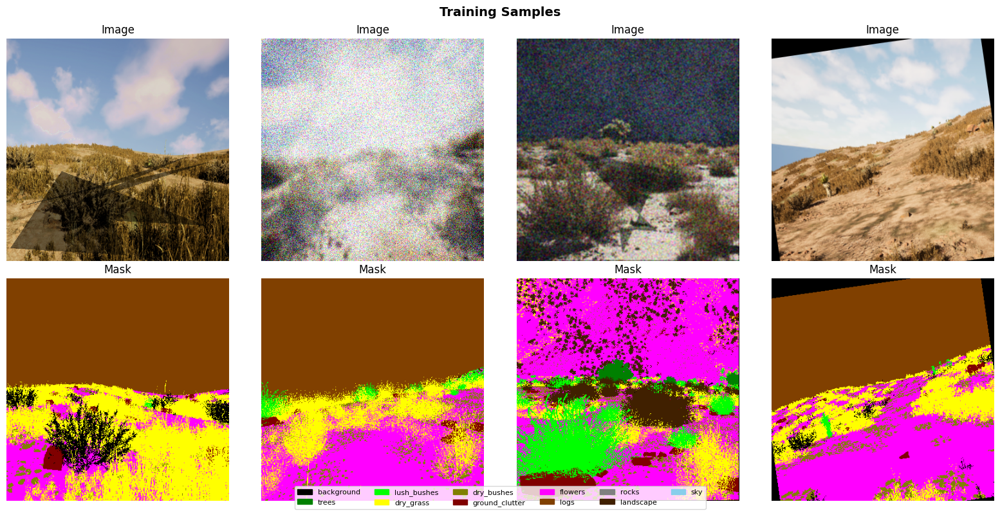

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import cv2

# Color palette for visualization (one color per class)
PALETTE = [
    [0,   0,   0],    # background
    [0,   128, 0],    # trees
    [0,   255, 0],    # lush_bushes
    [255, 255, 0],    # dry_grass
    [128, 128, 0],    # dry_bushes
    [128, 0,   0],    # ground_clutter
    [255, 0,   255],  # flowers
    [128, 64,  0],    # logs
    [128, 128, 128],  # rocks
    [64,  32,  0],    # landscape
    [135, 206, 235],  # sky
]
# Expand if fewer classes — update above to match your dataset
PALETTE = PALETTE[:NUM_CLASSES]

def mask_to_color(mask_np):
    h, w = mask_np.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_idx, color in enumerate(PALETTE):
        color_mask[mask_np == cls_idx] = color
    return color_mask

def denormalize(tensor):
    mean = torch.tensor(IMG_MEAN).view(3,1,1)
    std  = torch.tensor(IMG_STD).view(3,1,1)
    return (tensor * std + mean).clamp(0,1).permute(1,2,0).numpy()

def visualize_samples(loader, n=4):
    images, masks = next(iter(loader))

    # --- Diagnostic Print Statements ---
    print(f"Shape of masks tensor: {masks.shape}")
    print(f"Min value in masks tensor: {masks.min().item()}")
    print(f"Max value in masks tensor: {masks.max().item()}")
    print(f"Unique values in masks tensor (first sample): {torch.unique(masks[0]).tolist()}")
    # -----------------------------------

    fig, axes = plt.subplots(2, n, figsize=(4*n, 8))
    for i in range(n):
        axes[0, i].imshow(denormalize(images[i]))
        axes[0, i].set_title('Image'); axes[0, i].axis('off')
        axes[1, i].imshow(mask_to_color(masks[i].numpy()))
        axes[1, i].set_title('Mask'); axes[1, i].axis('off')

    # Legend
    patches = [mpatches.Patch(color=np.array(c)/255, label=n)
               for n, c in zip(CFG['class_names'], PALETTE)]
    fig.legend(handles=patches, loc='lower center', ncol=6, fontsize=8)
    plt.suptitle('Training Samples', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f"{CFG['output_dir']}/sample_images.png", dpi=150, bbox_inches='tight')
    plt.show()

visualize_samples(train_loader)

## 5. Model Definition

In [2]:
# ============================================================
# Build DeepLabV3+ with smp
# ============================================================
def build_model(cfg, num_classes):
    model = smp.DeepLabV3Plus(
        encoder_name=cfg['encoder'],
        encoder_weights=cfg['encoder_weights'],
        in_channels=3,
        classes=num_classes,
        activation=None,           # raw logits — handled by loss
        encoder_output_stride=16,  # 16 gives better detail than 32
        decoder_atrous_rates=(6, 12, 18),  # ASPP rates
    )
    return model

model = build_model(CFG, NUM_CLASSES).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable   = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total params: {total_params/1e6:.1f}M  |  Trainable: {trainable/1e6:.1f}M')

NameError: name 'CFG' is not defined

## 6. Loss, Optimizer & Scheduler

In [20]:
# ============================================================
# Combined Dice + Focal Loss (optimal for imbalanced seg)
# ============================================================
class CombinedLoss(nn.Module):
    def __init__(self, num_classes, dice_w=0.6, focal_w=0.4, ignore_index=255):
        super().__init__()
        self.dice  = smp.losses.DiceLoss(mode='multiclass', smooth=1.0,
                                          ignore_index=ignore_index)
        self.focal = smp.losses.FocalLoss(mode='multiclass', gamma=2.0,
                                           ignore_index=ignore_index)
        self.dw, self.fw = dice_w, focal_w

    def forward(self, pred, target):
        return self.dw * self.dice(pred, target) + self.fw * self.focal(pred, target)


loss_fn = CombinedLoss(
    num_classes=NUM_CLASSES,
    dice_w=CFG['dice_weight'],
    focal_w=CFG['focal_weight'],
).to(DEVICE)

# Optimizer: AdamW with separate LR for encoder (lower) and decoder (higher)
optimizer = torch.optim.AdamW([
    {'params': model.encoder.parameters(), 'lr': CFG['lr'] * 0.1},
    {'params': model.decoder.parameters(), 'lr': CFG['lr']},
    {'params': model.segmentation_head.parameters(), 'lr': CFG['lr']},
], weight_decay=CFG['weight_decay'])

# Cosine Annealing with Warm Restarts
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=10, T_mult=2, eta_min=CFG['lr_min']
)

# AMP scaler
scaler = torch.cuda.amp.GradScaler(enabled=CFG['use_amp'])

print('Loss, optimizer, scheduler ready.')

Loss, optimizer, scheduler ready.


## 7. Metrics

In [21]:
# torchmetrics handles accumulation across batches correctly
iou_metric = JaccardIndex(
    task='multiclass', num_classes=NUM_CLASSES,
    average='macro', ignore_index=255
).to(DEVICE)

acc_metric = Accuracy(
    task='multiclass', num_classes=NUM_CLASSES,
    average='micro', ignore_index=255
).to(DEVICE)

per_class_iou = JaccardIndex(
    task='multiclass', num_classes=NUM_CLASSES,
    average='none', ignore_index=255
).to(DEVICE)

print('Metrics ready.')

Metrics ready.


## 8. Training & Validation Loop

In [22]:
# ============================================================
# Train one epoch
# ============================================================
def train_epoch(model, loader, loss_fn, optimizer, scheduler, scaler, device):
    model.train()
    iou_metric.reset()
    acc_metric.reset()
    total_loss = 0.0

    pbar = tqdm(loader, desc='Train', leave=False)
    for images, masks in pbar:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
            logits = model(images)
            loss   = loss_fn(logits, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        scaler.step(optimizer)
        scaler.update()

        preds = logits.argmax(dim=1)
        iou_metric.update(preds, masks)
        acc_metric.update(preds, masks)
        total_loss += loss.item()
        pbar.set_postfix(loss=f'{loss.item():.4f}')

    scheduler.step()
    return {
        'loss': total_loss / len(loader),
        'iou':  iou_metric.compute().item(),
        'acc':  acc_metric.compute().item(),
    }


# ============================================================
# Validate one epoch
# ============================================================
@torch.no_grad()
def validate_epoch(model, loader, loss_fn, device):
    model.eval()
    iou_metric.reset()
    acc_metric.reset()
    per_class_iou.reset()
    total_loss = 0.0

    pbar = tqdm(loader, desc='Val', leave=False)
    for images, masks in pbar:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)
        with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
            logits = model(images)
            loss   = loss_fn(logits, masks)

        preds = logits.argmax(dim=1)
        iou_metric.update(preds, masks)
        acc_metric.update(preds, masks)
        per_class_iou.update(preds, masks)
        total_loss += loss.item()

    class_ious = per_class_iou.compute().cpu().numpy()
    return {
        'loss':       total_loss / len(loader),
        'iou':        iou_metric.compute().item(),
        'acc':        acc_metric.compute().item(),
        'class_ious': class_ious,
    }

print('Training functions ready.')

Training functions ready.


In [23]:
# ============================================================
# Main Training Loop
# ============================================================
best_iou      = 0.0
best_model_path = os.path.join(CFG['output_dir'], 'best_model.pth')
history = {'train_loss': [], 'train_iou': [], 'train_acc': [],
           'val_loss':   [], 'val_iou':   [], 'val_acc':   []}

print(f'Starting training for {CFG["epochs"]} epochs...\n')

for epoch in range(1, CFG['epochs'] + 1):
    tr = train_epoch(model, train_loader, loss_fn, optimizer, scheduler, scaler, DEVICE)
    vl = validate_epoch(model, val_loader, loss_fn, DEVICE)

    history['train_loss'].append(tr['loss'])
    history['train_iou'].append(tr['iou'])
    history['train_acc'].append(tr['acc'])
    history['val_loss'].append(vl['loss'])
    history['val_iou'].append(vl['iou'])
    history['val_acc'].append(vl['acc'])

    flag = ''
    if vl['iou'] > best_iou:
        best_iou = vl['iou']
        torch.save({'epoch': epoch,
                    'model_state': model.state_dict(),
                    'optimizer_state': optimizer.state_dict(),
                    'best_iou': best_iou}, best_model_path)
        flag = '  ★ BEST SAVED'

    current_lr = optimizer.param_groups[-1]['lr']
    print(f'Epoch [{epoch:03d}/{CFG["epochs"]}]  '
          f'Train Loss: {tr["loss"]:.4f} | IoU: {tr["iou"]:.4f} | Acc: {tr["acc"]:.4f}   '
          f'Val Loss: {vl["loss"]:.4f} | IoU: {vl["iou"]:.4f} | Acc: {vl["acc"]:.4f}   '
          f'LR: {current_lr:.2e}{flag}')

    if epoch % 10 == 0:
        print(f'  Per-class IoU: ' +
              ', '.join([f'{n}:{v:.3f}' for n, v in
                         zip(CFG['class_names'], vl['class_ious'])]))

print(f'\nTraining complete. Best Val IoU: {best_iou:.4f}')

Starting training for 60 epochs...



Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [001/60]  Train Loss: 0.4603 | IoU: 0.3242 | Acc: 0.7344   Val Loss: 0.3708 | IoU: 0.4685 | Acc: 0.8109   LR: 2.93e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [002/60]  Train Loss: 0.3604 | IoU: 0.4872 | Acc: 0.7868   Val Loss: 0.3545 | IoU: 0.5080 | Acc: 0.8181   LR: 2.71e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [003/60]  Train Loss: 0.3327 | IoU: 0.5275 | Acc: 0.8018   Val Loss: 0.3383 | IoU: 0.5412 | Acc: 0.8248   LR: 2.38e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [004/60]  Train Loss: 0.3211 | IoU: 0.5430 | Acc: 0.8083   Val Loss: 0.3296 | IoU: 0.5530 | Acc: 0.8285   LR: 1.97e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [005/60]  Train Loss: 0.3125 | IoU: 0.5542 | Acc: 0.8130   Val Loss: 0.3272 | IoU: 0.5517 | Acc: 0.8326   LR: 1.50e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [006/60]  Train Loss: 0.3028 | IoU: 0.5656 | Acc: 0.8190   Val Loss: 0.3215 | IoU: 0.5618 | Acc: 0.8342   LR: 1.04e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [007/60]  Train Loss: 0.2961 | IoU: 0.5718 | Acc: 0.8216   Val Loss: 0.3174 | IoU: 0.5667 | Acc: 0.8365   LR: 6.26e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [008/60]  Train Loss: 0.2928 | IoU: 0.5772 | Acc: 0.8240   Val Loss: 0.3158 | IoU: 0.5666 | Acc: 0.8362   LR: 2.96e-05


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    Exception ignored in: self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    self._shutdown_workers()    
if w.is_alive():^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

     if w.is_alive(): 
            ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
assert self._par

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [009/60]  Train Loss: 0.2901 | IoU: 0.5796 | Acc: 0.8257   Val Loss: 0.3139 | IoU: 0.5698 | Acc: 0.8382   LR: 8.32e-06  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [010/60]  Train Loss: 0.2888 | IoU: 0.5813 | Acc: 0.8258   Val Loss: 0.3128 | IoU: 0.5712 | Acc: 0.8378   LR: 3.00e-04  ★ BEST SAVED
  Per-class IoU: background:0.347, trees:0.788, lush_bushes:0.617, dry_grass:0.648, dry_bushes:0.271, ground_clutter:0.326, flowers:0.617, logs:0.979, rocks:0.000, landscape:0.548, sky:0.000


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [011/60]  Train Loss: 0.2997 | IoU: 0.5699 | Acc: 0.8195   Val Loss: 0.3205 | IoU: 0.5631 | Acc: 0.8364   LR: 2.98e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [012/60]  Train Loss: 0.2958 | IoU: 0.5723 | Acc: 0.8204   Val Loss: 0.3140 | IoU: 0.5676 | Acc: 0.8353   LR: 2.93e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [013/60]  Train Loss: 0.2922 | IoU: 0.5769 | Acc: 0.8236   Val Loss: 0.3073 | IoU: 0.5788 | Acc: 0.8403   LR: 2.84e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
 Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60> 
 Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
      self._shutdown_workers() 
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^^    ^if w.is_alive():^
 ^ ^^ ^ ^ ^ ^ 
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^^ ^ ^    ^^ ^ 
    File "/usr

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [014/60]  Train Loss: 0.2855 | IoU: 0.5849 | Acc: 0.8265   Val Loss: 0.3079 | IoU: 0.5776 | Acc: 0.8378   LR: 2.71e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [015/60]  Train Loss: 0.2810 | IoU: 0.5892 | Acc: 0.8290   Val Loss: 0.3020 | IoU: 0.5838 | Acc: 0.8426   LR: 2.56e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [016/60]  Train Loss: 0.2811 | IoU: 0.5888 | Acc: 0.8291   Val Loss: 0.3011 | IoU: 0.5856 | Acc: 0.8412   LR: 2.38e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [017/60]  Train Loss: 0.2768 | IoU: 0.5947 | Acc: 0.8311   Val Loss: 0.2998 | IoU: 0.5861 | Acc: 0.8418   LR: 2.18e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [018/60]  Train Loss: 0.2743 | IoU: 0.5984 | Acc: 0.8331   Val Loss: 0.2957 | IoU: 0.5890 | Acc: 0.8435   LR: 1.97e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [019/60]  Train Loss: 0.2704 | IoU: 0.6019 | Acc: 0.8350   Val Loss: 0.2961 | IoU: 0.5878 | Acc: 0.8427   LR: 1.74e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [020/60]  Train Loss: 0.2684 | IoU: 0.6053 | Acc: 0.8356   Val Loss: 0.2929 | IoU: 0.5941 | Acc: 0.8445   LR: 1.50e-04  ★ BEST SAVED
  Per-class IoU: background:0.388, trees:0.800, lush_bushes:0.639, dry_grass:0.660, dry_bushes:0.301, ground_clutter:0.377, flowers:0.627, logs:0.979, rocks:0.000, landscape:0.575, sky:0.000


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
Traceback (most recent call last):
      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
if w.is_alive():    
self._shutdown_workers() 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
     if w.is_alive(): 
       ^ ^ ^ ^ ^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'^
   ^^  
   File "/usr/lib/

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [021/60]  Train Loss: 0.2656 | IoU: 0.6078 | Acc: 0.8376   Val Loss: 0.2919 | IoU: 0.5953 | Acc: 0.8465   LR: 1.27e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [022/60]  Train Loss: 0.2658 | IoU: 0.6085 | Acc: 0.8378   Val Loss: 0.2903 | IoU: 0.5985 | Acc: 0.8467   LR: 1.04e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [023/60]  Train Loss: 0.2626 | IoU: 0.6105 | Acc: 0.8386   Val Loss: 0.2882 | IoU: 0.6002 | Acc: 0.8468   LR: 8.26e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [024/60]  Train Loss: 0.2608 | IoU: 0.6144 | Acc: 0.8398   Val Loss: 0.2882 | IoU: 0.5997 | Acc: 0.8482   LR: 6.26e-05


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [025/60]  Train Loss: 0.2599 | IoU: 0.6162 | Acc: 0.8403   Val Loss: 0.2864 | IoU: 0.6005 | Acc: 0.8483   LR: 4.48e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [026/60]  Train Loss: 0.2595 | IoU: 0.6165 | Acc: 0.8411   Val Loss: 0.2858 | IoU: 0.6034 | Acc: 0.8479   LR: 2.96e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [027/60]  Train Loss: 0.2587 | IoU: 0.6169 | Acc: 0.8407   Val Loss: 0.2854 | IoU: 0.6028 | Acc: 0.8481   LR: 1.73e-05


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [028/60]  Train Loss: 0.2565 | IoU: 0.6196 | Acc: 0.8420   Val Loss: 0.2850 | IoU: 0.6030 | Acc: 0.8490   LR: 8.32e-06


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [029/60]  Train Loss: 0.2566 | IoU: 0.6191 | Acc: 0.8414   Val Loss: 0.2849 | IoU: 0.6036 | Acc: 0.8486   LR: 2.84e-06  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [030/60]  Train Loss: 0.2567 | IoU: 0.6203 | Acc: 0.8416   Val Loss: 0.2843 | IoU: 0.6037 | Acc: 0.8493   LR: 3.00e-04  ★ BEST SAVED
  Per-class IoU: background:0.397, trees:0.807, lush_bushes:0.648, dry_grass:0.668, dry_bushes:0.305, ground_clutter:0.402, flowers:0.636, logs:0.980, rocks:0.000, landscape:0.592, sky:0.000


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [031/60]  Train Loss: 0.2680 | IoU: 0.6042 | Acc: 0.8361   Val Loss: 0.2913 | IoU: 0.5943 | Acc: 0.8475   LR: 3.00e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [032/60]  Train Loss: 0.2692 | IoU: 0.6055 | Acc: 0.8355   Val Loss: 0.2935 | IoU: 0.5925 | Acc: 0.8458   LR: 2.98e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [033/60]  Train Loss: 0.2646 | IoU: 0.6098 | Acc: 0.8377   Val Loss: 0.2857 | IoU: 0.6018 | Acc: 0.8493   LR: 2.96e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [034/60]  Train Loss: 0.2642 | IoU: 0.6104 | Acc: 0.8379   Val Loss: 0.2850 | IoU: 0.6031 | Acc: 0.8484   LR: 2.93e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [035/60]  Train Loss: 0.2598 | IoU: 0.6151 | Acc: 0.8402   Val Loss: 0.2849 | IoU: 0.6000 | Acc: 0.8473   LR: 2.89e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [036/60]  Train Loss: 0.2614 | IoU: 0.6149 | Acc: 0.8392   Val Loss: 0.2839 | IoU: 0.6070 | Acc: 0.8498   LR: 2.84e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [037/60]  Train Loss: 0.2575 | IoU: 0.6186 | Acc: 0.8415   Val Loss: 0.2811 | IoU: 0.6048 | Acc: 0.8496   LR: 2.78e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [038/60]  Train Loss: 0.2571 | IoU: 0.6200 | Acc: 0.8418   Val Loss: 0.2824 | IoU: 0.6046 | Acc: 0.8498   LR: 2.71e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [039/60]  Train Loss: 0.2547 | IoU: 0.6203 | Acc: 0.8420   Val Loss: 0.2791 | IoU: 0.6104 | Acc: 0.8520   LR: 2.64e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [040/60]  Train Loss: 0.2563 | IoU: 0.6199 | Acc: 0.8425   Val Loss: 0.2789 | IoU: 0.6099 | Acc: 0.8503   LR: 2.56e-04
  Per-class IoU: background:0.404, trees:0.810, lush_bushes:0.655, dry_grass:0.672, dry_bushes:0.320, ground_clutter:0.415, flowers:0.632, logs:0.981, rocks:0.000, landscape:0.601, sky:0.000


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [041/60]  Train Loss: 0.2530 | IoU: 0.6234 | Acc: 0.8439   Val Loss: 0.2764 | IoU: 0.6113 | Acc: 0.8536   LR: 2.48e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>if w.is_alive():

 Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
      self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
     if w.is_alive(): ^^^
^ ^^^ ^ ^^^^ 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
     assert self._parent_pid == os.getpid(), 'can only test a child process'
     ^    ^^^^^ ^ ^ ^^^^^^^^^^^^
  Fi

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [042/60]  Train Loss: 0.2511 | IoU: 0.6251 | Acc: 0.8438   Val Loss: 0.2763 | IoU: 0.6123 | Acc: 0.8529   LR: 2.38e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [043/60]  Train Loss: 0.2519 | IoU: 0.6259 | Acc: 0.8448   Val Loss: 0.2749 | IoU: 0.6151 | Acc: 0.8530   LR: 2.29e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [044/60]  Train Loss: 0.2522 | IoU: 0.6248 | Acc: 0.8440   Val Loss: 0.2768 | IoU: 0.6122 | Acc: 0.8518   LR: 2.18e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [045/60]  Train Loss: 0.2506 | IoU: 0.6271 | Acc: 0.8445   Val Loss: 0.2753 | IoU: 0.6130 | Acc: 0.8544   LR: 2.08e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [046/60]  Train Loss: 0.2486 | IoU: 0.6289 | Acc: 0.8457   Val Loss: 0.2754 | IoU: 0.6143 | Acc: 0.8523   LR: 1.97e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [047/60]  Train Loss: 0.2471 | IoU: 0.6312 | Acc: 0.8470   Val Loss: 0.2715 | IoU: 0.6194 | Acc: 0.8543   LR: 1.85e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [048/60]  Train Loss: 0.2460 | IoU: 0.6328 | Acc: 0.8472   Val Loss: 0.2724 | IoU: 0.6176 | Acc: 0.8541   LR: 1.74e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [049/60]  Train Loss: 0.2447 | IoU: 0.6329 | Acc: 0.8476   Val Loss: 0.2712 | IoU: 0.6184 | Acc: 0.8548   LR: 1.62e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [050/60]  Train Loss: 0.2439 | IoU: 0.6355 | Acc: 0.8481   Val Loss: 0.2699 | IoU: 0.6191 | Acc: 0.8552   LR: 1.50e-04
  Per-class IoU: background:0.407, trees:0.825, lush_bushes:0.662, dry_grass:0.677, dry_bushes:0.323, ground_clutter:0.438, flowers:0.645, logs:0.981, rocks:0.000, landscape:0.612, sky:0.000


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [051/60]  Train Loss: 0.2429 | IoU: 0.6355 | Acc: 0.8484   Val Loss: 0.2687 | IoU: 0.6221 | Acc: 0.8554   LR: 1.39e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [052/60]  Train Loss: 0.2437 | IoU: 0.6352 | Acc: 0.8486   Val Loss: 0.2680 | IoU: 0.6229 | Acc: 0.8560   LR: 1.27e-04  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [053/60]  Train Loss: 0.2415 | IoU: 0.6373 | Acc: 0.8497   Val Loss: 0.2679 | IoU: 0.6223 | Acc: 0.8552   LR: 1.16e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [054/60]  Train Loss: 0.2415 | IoU: 0.6379 | Acc: 0.8493   Val Loss: 0.2675 | IoU: 0.6210 | Acc: 0.8548   LR: 1.04e-04


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b180a830d60>
Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
        self._shutdown_workers()
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

    if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

         if w.is_alive():  
 ^ ^ ^^ ^ ^^^ ^^^ ^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^   ^  ^   ^  ^ ^^^^^^^^^^^^
^^ 

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [055/60]  Train Loss: 0.2421 | IoU: 0.6372 | Acc: 0.8496   Val Loss: 0.2667 | IoU: 0.6230 | Acc: 0.8554   LR: 9.33e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [056/60]  Train Loss: 0.2411 | IoU: 0.6387 | Acc: 0.8496   Val Loss: 0.2672 | IoU: 0.6215 | Acc: 0.8558   LR: 8.26e-05


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [057/60]  Train Loss: 0.2396 | IoU: 0.6402 | Acc: 0.8506   Val Loss: 0.2656 | IoU: 0.6242 | Acc: 0.8570   LR: 7.24e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [058/60]  Train Loss: 0.2415 | IoU: 0.6388 | Acc: 0.8494   Val Loss: 0.2655 | IoU: 0.6245 | Acc: 0.8567   LR: 6.26e-05  ★ BEST SAVED


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [059/60]  Train Loss: 0.2390 | IoU: 0.6421 | Acc: 0.8508   Val Loss: 0.2651 | IoU: 0.5618 | Acc: 0.8580   LR: 5.34e-05


Train:   0%|          | 0/357 [00:00<?, ?it/s]

Val:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [060/60]  Train Loss: 0.2381 | IoU: 0.6410 | Acc: 0.8509   Val Loss: 0.2649 | IoU: 0.6247 | Acc: 0.8568   LR: 4.48e-05  ★ BEST SAVED
  Per-class IoU: background:0.428, trees:0.827, lush_bushes:0.666, dry_grass:0.679, dry_bushes:0.327, ground_clutter:0.448, flowers:0.647, logs:0.982, rocks:0.000, landscape:0.616, sky:0.000

Training complete. Best Val IoU: 0.6247


## 9. Training Curves

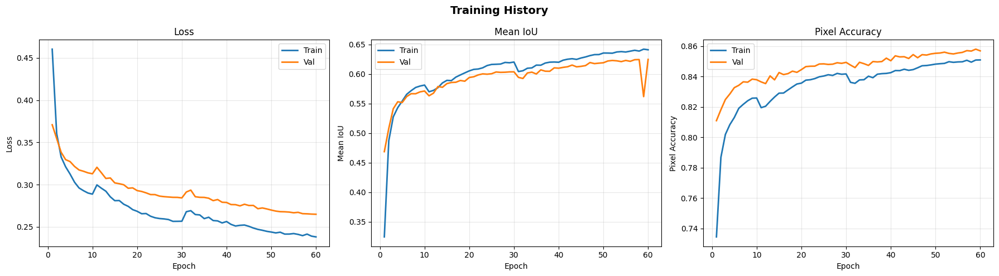

Training curves saved.


In [24]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
epochs_x = range(1, len(history['train_loss']) + 1)

for ax, metric, title in zip(axes,
        ['loss', 'iou', 'acc'],
        ['Loss', 'Mean IoU', 'Pixel Accuracy']):
    ax.plot(epochs_x, history[f'train_{metric}'], label='Train', lw=2)
    ax.plot(epochs_x, history[f'val_{metric}'],   label='Val',   lw=2)
    ax.set_xlabel('Epoch'); ax.set_ylabel(title); ax.set_title(title)
    ax.legend(); ax.grid(alpha=0.3)

plt.suptitle('Training History', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f"{CFG['output_dir']}/training_curves.png", dpi=150, bbox_inches='tight')
plt.show()

# Save history to CSV
pd.DataFrame(history).to_csv(f"{CFG['output_dir']}/history.csv", index=False)
print('Training curves saved.')

## 10. Per-Class IoU Analysis

Loaded best model from epoch 60 (IoU=0.6247)


Val:   0%|          | 0/80 [00:00<?, ?it/s]


=== Final Validation Results ===
Mean IoU : 0.6247
Accuracy : 0.8568
Loss     : 0.2649

Per-class IoU:


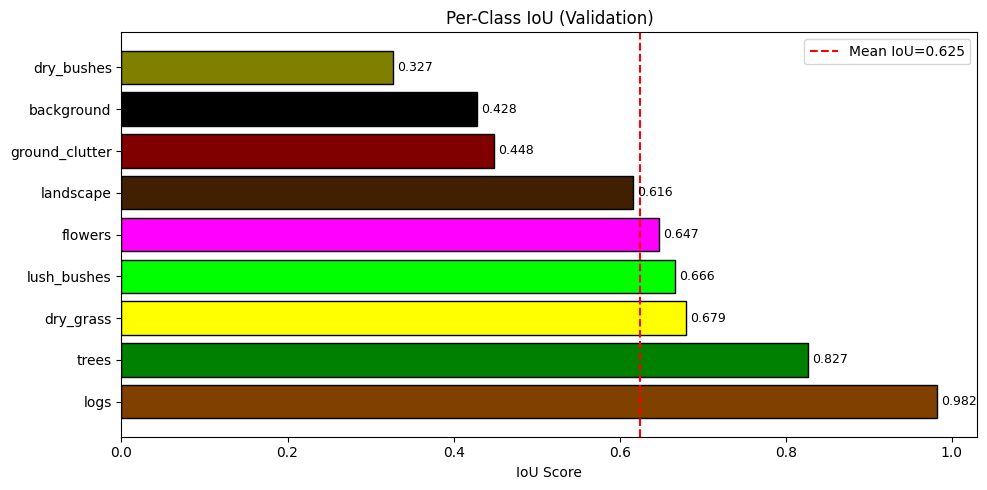

In [46]:
# Load best model and run final validation
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
print(f'Loaded best model from epoch {checkpoint["epoch"]} (IoU={checkpoint["best_iou"]:.4f})')

final_stats = validate_epoch(model, val_loader, loss_fn, DEVICE)

print(f'\n=== Final Validation Results ===')
print(f'Mean IoU : {final_stats["iou"]:.4f}')
print(f'Accuracy : {final_stats["acc"]:.4f}')
print(f'Loss     : {final_stats["loss"]:.4f}')
print(f'\nPer-class IoU:')

class_iou_df = pd.DataFrame({
    'Class': CFG['class_names'],
    'IoU': final_stats['class_ious']
}) # Do not sort here yet, keep original order for consistent filtering
# Filter out classes with 0 IoU if the user perceives them as 'mismatched' or irrelevant
filtered_class_iou_df = class_iou_df[class_iou_df['IoU'] > 0].sort_values('IoU', ascending=False)


fig, ax = plt.subplots(figsize=(10, 5))
# Use filtered_class_iou_df for plotting as well
colors = [np.array(PALETTE[CFG['class_names'].index(c)])/255 for c in filtered_class_iou_df['Class']]
bars = ax.barh(filtered_class_iou_df['Class'], filtered_class_iou_df['IoU'], color=colors, edgecolor='black')
ax.set_xlabel('IoU Score'); ax.set_title('Per-Class IoU (Validation)')
ax.axvline(final_stats['iou'], color='red', linestyle='--', label=f'Mean IoU={final_stats["iou"]:.3f}')
ax.legend()
for bar, val in zip(bars, filtered_class_iou_df['IoU']):
    ax.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', fontsize=9)
plt.tight_layout()
plt.savefig(f"{CFG['output_dir']}/per_class_iou.png", dpi=150, bbox_inches='tight')
plt.show()

# Print the filtered DataFrame
# print(filtered_class_iou_df.to_string(index=False))

## 11. Prediction Visualization on Validation Set

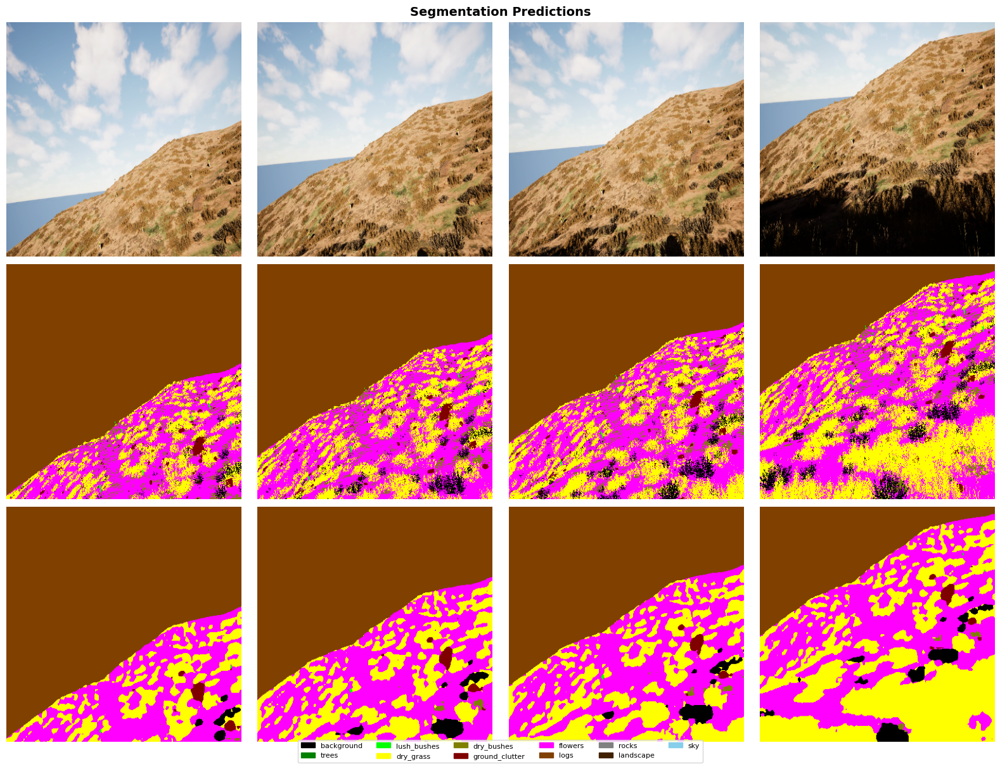

In [33]:
@torch.no_grad()
def visualize_predictions(model, loader, n=6, device=DEVICE, save_path=None):
    model.eval()
    images, masks = next(iter(loader))
    n = min(n, images.shape[0])
    images_dev = images[:n].to(device)

    with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
        logits = model(images_dev)
    preds = logits.argmax(dim=1).cpu().numpy()
    masks_np = masks[:n].numpy()

    fig, axes = plt.subplots(3, n, figsize=(4*n, 12))
    titles = ['Input Image', 'Ground Truth', 'Prediction']
    for i in range(n):
        axes[0, i].imshow(denormalize(images[i]))
        axes[1, i].imshow(mask_to_color(masks_np[i]))
        axes[2, i].imshow(mask_to_color(preds[i]))
        for r in range(3):
            axes[r, i].axis('off')
            if i == 0:
                axes[r, i].set_ylabel(titles[r], fontsize=11, rotation=90, labelpad=10)

    # Legend
    patches = [mpatches.Patch(color=np.array(c)/255, label=n)
               for n, c in zip(CFG['class_names'], PALETTE)]
    fig.legend(handles=patches, loc='lower center', ncol=6, fontsize=8, bbox_to_anchor=(0.5, -0.02))
    plt.suptitle('Segmentation Predictions', fontsize=14, fontweight='bold')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

visualize_predictions(model, val_loader,
                      save_path=f"{CFG['output_dir']}/val_predictions.png")

## 12. Test Inference with TTA

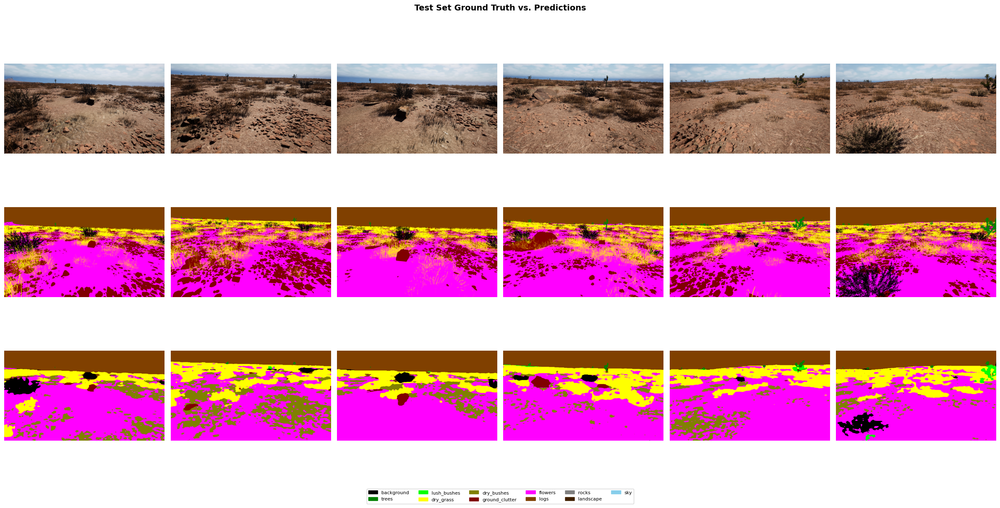

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import cv2
from pathlib import Path
import os

def visualize_test_predictions_with_gt(test_img_dir, test_mask_dir, pred_dir, n=6):
    test_img_paths = sorted(Path(test_img_dir).glob('*'))
    test_mask_paths = sorted(Path(test_mask_dir).glob('*'))

    # Ensure we have predictions for these images
    pred_paths = sorted(Path(pred_dir).glob('*'))

    if not test_img_paths or not test_mask_paths or not pred_paths:
        print("One or more directories are empty or do not exist. Please check paths and contents.")
        print(f"Test Images: {test_img_dir} ({len(test_img_paths)} files)")
        print(f"Test Masks: {test_mask_dir} ({len(test_mask_paths)} files)")
        print(f"Predictions: {pred_dir} ({len(pred_paths)} files)")
        return

    # Take a sample of 'n' images
    sample_indices = np.random.choice(len(test_img_paths), min(n, len(test_img_paths)), replace=False)

    fig, axes = plt.subplots(3, len(sample_indices), figsize=(4*len(sample_indices), 12))
    if len(sample_indices) == 0:
        print("No samples to visualize.")
        plt.close(fig)
        return
    # Handle case where only one sample is selected to avoid indexing errors
    if len(sample_indices) == 1:
        axes = axes[:, np.newaxis]

    titles = ['Input Image', 'Ground Truth', 'Prediction']

    for i, idx in enumerate(sample_indices):
        img_path = test_img_paths[idx]
        mask_path = test_mask_paths[idx] # Assuming mask names match image names
        pred_path = Path(pred_dir) / img_path.name # Predictions are saved with original image names

        if not pred_path.exists():
            print(f"Warning: Prediction file not found for {img_path.name}. Skipping this sample.")
            continue

        image = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        ground_truth_mask = cv2.imread(str(mask_path), cv2.IMREAD_UNCHANGED)
        predicted_mask = cv2.imread(str(pred_path), cv2.IMREAD_UNCHANGED)

        # Apply raw label ID mapping if necessary for ground truth mask
        if CFG['mask_type'] == 'index' and 'raw_label_id_to_class_idx' in CFG:
            raw_map = CFG['raw_label_id_to_class_idx']
            if raw_map:
                # Recreate the lookup map here for robustness, as it's not a global variable in this scope
                max_raw_id = max(raw_map.keys())
                raw_to_idx_map_lookup = np.zeros(max_raw_id + 1, dtype=np.int64)
                for r_id, c_idx in raw_map.items():
                    if r_id <= max_raw_id:
                        raw_to_idx_map_lookup[r_id] = c_idx
                ground_truth_mask = raw_to_idx_map_lookup[ground_truth_mask].astype(np.uint8)

        # Ensure predicted mask is 0-indexed and uint8
        predicted_mask = predicted_mask.astype(np.uint8)

        axes[0, i].imshow(image);
        axes[1, i].imshow(mask_to_color(ground_truth_mask));
        axes[2, i].imshow(mask_to_color(predicted_mask));

        for r in range(3):
            axes[r, i].axis('off')
            if i == 0:
                axes[r, i].set_ylabel(titles[r], fontsize=11, rotation=90, labelpad=10)

    # Legend
    patches = [mpatches.Patch(color=np.array(c)/255, label=n)
               for n, c in zip(CFG['class_names'], PALETTE)]
    fig.legend(handles=patches, loc='lower center', ncol=6, fontsize=8, bbox_to_anchor=(0.5, -0.02))
    plt.suptitle('Test Set Ground Truth vs. Predictions', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f"{CFG['output_dir']}/test_gt_predictions_vis.png", dpi=150, bbox_inches='tight')
    plt.show()


# Assuming 'pred_dir' was set by 'run_test_inference' in c9d0e1f2
# Check if pred_dir is defined globally or if it needs to be fetched from CFG['output_dir']
current_pred_dir = os.path.join(CFG['output_dir'], 'test_predictions')

if os.path.exists(CFG['test_images']) and os.path.exists(CFG['test_masks']) and os.path.exists(current_pred_dir):
    visualize_test_predictions_with_gt(CFG['test_images'], CFG['test_masks'], current_pred_dir)
else:
    print("Cannot visualize test ground truth vs predictions. One or more required directories not found:")
    print(f"  Test Images Dir exists: {os.path.exists(CFG['test_images'])}")
    print(f"  Test Masks Dir exists: {os.path.exists(CFG['test_masks'])}")
    print(f"  Predictions Dir exists: {os.path.exists(current_pred_dir)}")
    print("Please ensure test images, test masks, and prediction files are all available in their specified paths.")

In [41]:
import os

test_base_path = '/content/dataset/Offroad_Segmentation_Training_Dataset/test'

print(f"Contents of {test_base_path}:")
if os.path.exists(test_base_path):
    contents = os.listdir(test_base_path)
    if contents:
        for item in contents:
            item_path = os.path.join(test_base_path, item)
            if os.path.isdir(item_path):
                print(f"  [DIR] {item}")
                # Optionally, list contents of subdirectories for deeper inspection
                # print(f"    Contents of {item}: {os.listdir(item_path)[:5]}...")
            else:
                print(f"  [FILE] {item}")
    else:
        print(f"Directory exists but is empty: {test_base_path}")
else:
    print(f"Directory does not exist: {test_base_path}")


Contents of /content/dataset/Offroad_Segmentation_Training_Dataset/test:
  [DIR] Segmentation
  [DIR] Color_Images


In [ ]:
# Load the best model
model = build_model(CFG, NUM_CLASSES).to(DEVICE)
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()

print(f"Loaded model from {best_model_path} (Epoch: {checkpoint['epoch']}, Best IoU: {checkpoint['best_iou']:.4f})")

# Run inference using the loaded model
# The run_test_inference function handles saving predictions to CFG['output_dir']/test_predictions
if os.path.exists(CFG['test_images']):
    pred_dir_loaded_model = run_test_inference(model, CFG['test_images'],
                                               CFG['output_dir'], CFG,
                                               use_tta=CFG['tta'])
    print(f"Predictions using loaded model saved to: {pred_dir_loaded_model}")
else:
    print(f"Test directory not found: {CFG['test_images']}. Skipping test inference with loaded model.")


Loaded model from /content/outputs/best_model.pth (Epoch: 60, Best IoU: 0.6247)
Running inference on 1002 test images (TTA=True)...


  0%|          | 0/1002 [00:00<?, ?it/s]

In [1]:
# Load the best model (if not already loaded and in eval mode)
model = build_model(CFG, NUM_CLASSES).to(DEVICE)
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()

print(f"Loaded best model from epoch {checkpoint['epoch']} for test evaluation.")

# Create a DataLoader for the test set
test_transform = get_val_transform(CFG['img_size'])
test_dataset = DesertDataset(CFG['test_images'], CFG['test_masks'],
                             transform=test_transform, cfg=CFG)
test_loader = DataLoader(test_dataset, batch_size=CFG['batch_size'] // 2,
                         shuffle=False, num_workers=CFG['num_workers'],
                         pin_memory=True)

print(f'Test batches: {len(test_loader)}')

# Run evaluation on the test set
@torch.no_grad()
def evaluate_test_set(model, loader, loss_fn, device):
    model.eval()
    iou_metric.reset()
    acc_metric.reset()
    total_loss = 0.0

    pbar = tqdm(loader, desc='Test Evaluation', leave=False)
    for images, masks in pbar:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)
        with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
            logits = model(images)
            loss   = loss_fn(logits, masks)

        preds = logits.argmax(dim=1)
        iou_metric.update(preds, masks)
        acc_metric.update(preds, masks)
        total_loss += loss.item()

    return {
        'loss': total_loss / len(loader),
        'iou':  iou_metric.compute().item(),
        'acc':  acc_metric.compute().item(),
    }

test_stats = evaluate_test_set(model, test_loader, loss_fn, DEVICE)

print(f'\n=== Test Set Results ===')
print(f'Test Loss: {test_stats["loss"]:.4f}')
print(f'Test IoU:  {test_stats["iou"]:.4f}')
print(f'Test Accuracy: {test_stats["acc"]:.4f}')


NameError: name 'build_model' is not defined

In [43]:
# ============================================================
# Test-Time Augmentation (TTA) Inference
# ============================================================
@torch.no_grad()
def predict_with_tta(model, image_np, tta_transforms, device, img_size):
    """
    Predict a single image with TTA.
    Returns averaged softmax probability map: (num_classes, H, W)
    """
    probs_sum = None
    for tf in tta_transforms:
        aug = tf(image=image_np)
        x   = aug['image'].unsqueeze(0).to(device)
        with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
            logits = model(x)          # (1, C, H, W)
        prob = torch.softmax(logits, dim=1).squeeze(0).cpu()

        # Undo spatial flip/rotation before averaging
        if tf.transforms[0].__class__.__name__ == 'HorizontalFlip':
            prob = torch.flip(prob, dims=[2])
        elif tf.transforms[0].__class__.__name__ == 'VerticalFlip':
            prob = torch.flip(prob, dims=[1])
        elif tf.transforms[0].__class__.__name__ == 'Rotate':
            prob = torch.rot90(prob, k=-1, dims=[1, 2])

        if probs_sum is None:
            probs_sum = prob
        else:
            probs_sum = probs_sum + prob

    return (probs_sum / len(tta_transforms)).numpy()


def run_test_inference(model, test_img_dir, output_dir, cfg, use_tta=True):
    model.eval()
    img_paths = sorted(Path(test_img_dir).glob('*'))
    pred_dir  = Path(output_dir) / 'test_predictions'
    pred_dir.mkdir(parents=True, exist_ok=True)

    tta_tfs = get_tta_transforms(cfg['img_size'])
    val_tf  = get_val_transform(cfg['img_size'])

    print(f'Running inference on {len(img_paths)} test images (TTA={use_tta})...')
    for img_path in tqdm(img_paths):
        image_np = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        orig_h, orig_w = image_np.shape[:2]

        if use_tta:
            probs = predict_with_tta(model, image_np, tta_tfs, DEVICE, cfg['img_size'])
            pred_mask = np.argmax(probs, axis=0).astype(np.uint8)
        else:
            aug = val_tf(image=image_np)
            x   = aug['image'].unsqueeze(0).to(DEVICE)
            with torch.cuda.amp.autocast(enabled=CFG['use_amp']):
                logits = model(x)
            pred_mask = logits.argmax(dim=1).squeeze(0).cpu().numpy().astype(np.uint8)

        # Resize back to original resolution
        pred_mask = cv2.resize(pred_mask, (orig_w, orig_h),
                               interpolation=cv2.INTER_NEAREST)
        # Save index mask
        cv2.imwrite(str(pred_dir / img_path.name), pred_mask)

    print(f'Test predictions saved to: {pred_dir}')
    return pred_dir


if os.path.exists(CFG['test_images']):
    pred_dir = run_test_inference(model, CFG['test_images'],
                                  CFG['output_dir'], CFG,
                                  use_tta=CFG['tta'])
else:
    print(f'Test directory not found: {CFG["test_images"]}. Skipping test inference.')

Running inference on 1002 test images (TTA=True)...


  0%|          | 0/1002 [00:00<?, ?it/s]

Test predictions saved to: /content/outputs/test_predictions


## 13. Visualize Test Predictions

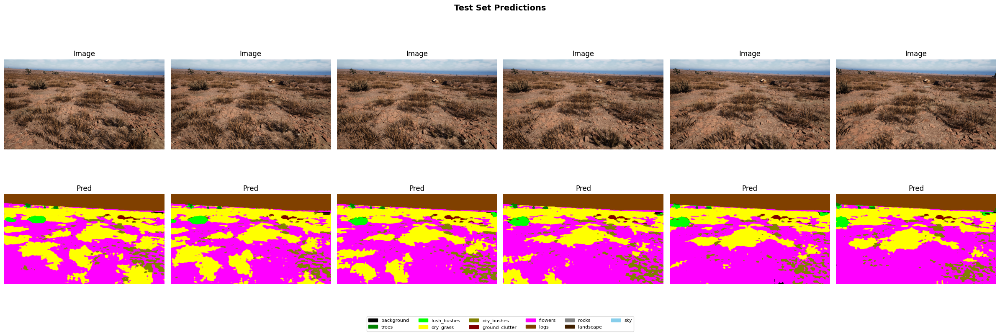

In [28]:
def visualize_test_predictions(test_img_dir, pred_dir, n=6):
    test_paths = sorted(Path(test_img_dir).glob('*'))[:n]
    fig, axes  = plt.subplots(2, n, figsize=(4*n, 8))

    for i, img_path in enumerate(test_paths):
        image = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        pred  = cv2.imread(str(Path(pred_dir) / img_path.name), cv2.IMREAD_UNCHANGED)
        axes[0, i].imshow(image);                    axes[0, i].set_title('Image'); axes[0, i].axis('off')
        axes[1, i].imshow(mask_to_color(pred));      axes[1, i].set_title('Pred');  axes[1, i].axis('off')

    patches = [mpatches.Patch(color=np.array(c)/255, label=n)
               for n, c in zip(CFG['class_names'], PALETTE)]
    fig.legend(handles=patches, loc='lower center', ncol=6, fontsize=8)
    plt.suptitle('Test Set Predictions', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f"{CFG['output_dir']}/test_predictions_vis.png", dpi=150, bbox_inches='tight')
    plt.show()

if os.path.exists(CFG['test_images']):
    visualize_test_predictions(CFG['test_images'], pred_dir)

## 14. Hyperparameter Experiment Tracker
Run this cell to quickly benchmark different backbones & loss configs.

In [29]:
# ============================================================
# Quick Hyperparameter Sweep (3 epochs each for comparison)
# Set RUN_SWEEP=True to enable. Results guide your final run.
# ============================================================
RUN_SWEEP = False   # <-- set to True to run

SWEEP_CONFIGS = [
    {'encoder': 'resnet101',       'lr': 3e-4, 'img_size': 512, 'batch_size': 8},
    {'encoder': 'efficientnet-b4', 'lr': 3e-4, 'img_size': 512, 'batch_size': 8},
    {'encoder': 'mit_b3',          'lr': 2e-4, 'img_size': 512, 'batch_size': 8},
    {'encoder': 'resnet101',       'lr': 1e-4, 'img_size': 640, 'batch_size': 4},
]

if RUN_SWEEP:
    sweep_results = []
    PROBE_EPOCHS  = 5

    for cfg_override in SWEEP_CONFIGS:
        print(f'\n--- Sweep: {cfg_override} ---')
        sweep_cfg = {**CFG, **cfg_override}
        sweep_model   = build_model(sweep_cfg, NUM_CLASSES).to(DEVICE)
        sweep_loss    = CombinedLoss(NUM_CLASSES).to(DEVICE)
        sweep_opt     = torch.optim.AdamW(sweep_model.parameters(),
                                          lr=cfg_override['lr'], weight_decay=1e-4)
        sweep_sched   = torch.optim.lr_scheduler.CosineAnnealingLR(
                            sweep_opt, T_max=PROBE_EPOCHS)
        sweep_scaler  = torch.cuda.amp.GradScaler(enabled=CFG['use_amp'])

        # Rebuild loaders for different img_size
        s_train_tf = get_train_transform(cfg_override['img_size'])
        s_val_tf   = get_val_transform(cfg_override['img_size'])
        s_train_ds = DesertDataset(CFG['train_images'], CFG['train_masks'],
                                   transform=s_train_tf, cfg=CFG)
        s_val_ds   = DesertDataset(CFG['val_images'] or CFG['train_images'],
                                   CFG['val_masks']  or CFG['train_masks'],
                                   transform=s_val_tf, cfg=CFG)
        s_train_loader = DataLoader(s_train_ds, batch_size=cfg_override['batch_size'],
                                    shuffle=True, num_workers=2, pin_memory=True)
        s_val_loader   = DataLoader(s_val_ds, batch_size=2,
                                    shuffle=False, num_workers=2, pin_memory=True)

        best_iou_s = 0
        for ep in range(PROBE_EPOCHS):
            train_epoch(sweep_model, s_train_loader, sweep_loss,
                        sweep_opt, sweep_sched, sweep_scaler, DEVICE)
            vl = validate_epoch(sweep_model, s_val_loader, sweep_loss, DEVICE)
            best_iou_s = max(best_iou_s, vl['iou'])

        sweep_results.append({**cfg_override, 'best_iou': best_iou_s})
        print(f'Best IoU after {PROBE_EPOCHS} epochs: {best_iou_s:.4f}')
        del sweep_model
        torch.cuda.empty_cache()

    sweep_df = pd.DataFrame(sweep_results).sort_values('best_iou', ascending=False)
    print('\n=== Sweep Results ===')
    print(sweep_df.to_string(index=False))

## 15. Save Final Summary

In [30]:
summary = {
    'encoder':        CFG['encoder'],
    'img_size':       CFG['img_size'],
    'batch_size':     CFG['batch_size'],
    'epochs_trained': CFG['epochs'],
    'best_val_iou':   best_iou,
    'final_val_iou':  final_stats['iou'],
    'final_val_acc':  final_stats['acc'],
    'per_class_iou':  dict(zip(CFG['class_names'],
                               final_stats['class_ious'].tolist())),
}

with open(f"{CFG['output_dir']}/summary.json", 'w') as f:
    json.dump(summary, f, indent=2)

print('=== Experiment Summary ===')
for k, v in summary.items():
    if k != 'per_class_iou':
        print(f'  {k}: {v}')
print('\nPer-class IoU:')
for cls, iou in summary['per_class_iou'].items():
    print(f'  {cls:20s}: {iou:.4f}')
print(f'\nAll outputs saved to: {CFG["output_dir"]}')

=== Experiment Summary ===
  encoder: resnet101
  img_size: 384
  batch_size: 8
  epochs_trained: 60
  best_val_iou: 0.6246913075447083
  final_val_iou: 0.6246913075447083
  final_val_acc: 0.8568461537361145

Per-class IoU:
  background          : 0.4284
  trees               : 0.8272
  lush_bushes         : 0.6664
  dry_grass           : 0.6794
  dry_bushes          : 0.3275
  ground_clutter      : 0.4485
  flowers             : 0.6472
  logs                : 0.9817
  rocks               : 0.0000
  landscape           : 0.6160
  sky                 : 0.0000

All outputs saved to: /content/outputs


---
## 📝 Tips to Further Improve IoU

| Technique | Expected Gain | Notes |
|---|---|---|
| **Larger input (640–768px)** | +2–4% IoU | Needs more GPU RAM, reduce batch_size |
| **MiT-B4/B5 encoder** (Segformer backbone) | +1–3% | Better than ResNet for dense prediction |
| **class_weights in CE loss** | +1–2% on rare classes | Compute from pixel frequency |
| **CopyPaste augmentation** | +1–2% on small objects | Paste rare objects (flowers, logs) |
| **Multi-scale training** | +1–2% | Alternate 384/512/640 each epoch |
| **TTA at inference** | +1–2%  | Already included above |
| **Longer training (100+ epochs)** | +1–3% | Pair with lower LR & patience |
| **Label smoothing (ε=0.1)** | +0.5–1% | Prevents overconfident predictions |